# Where should we look for a flat in Lyon

## Introduction

After 6 years in Asia and Italy, I now plan to come back to my city Lyon, in France ! I have budget of 1000€ max for the flat, but if the neighborhood is less attractive for me, I want to pay less. So I want to define a maximum rent for each neighborhood above which I will not consider the offer. This maximum price will depend on three factors :
- How far is the neighborhood from my job located at the East Hospital of Lyon  by public transportation
- How many pizzerias and italian restaurants are in walking distance (I miss Italy)
- How many Asian restaurants are closeby (I miss Asia too)

I will set my initial budget to 1000€ per month. Then, I will ponderate as follows:
- The distance to my working place by public transportation will generate a malus of 100€ per 5 minutes. In other words, I'm OK for a flat up to 1000€ at work, but if the travel time to work is 30 minutes, my limit will be 1000-600=400€ per month.
- The presence of a pizzeria in the 100m around the neighborhood center will generate a bonus of 10€. Then, between 100 and 1100m, the bonus will be linearly decreasing with the distance (i.e. a pizzeria at a distance of 600m will generate a bonus of 5€). This bonus is cumulative (i.e. having a pizzeria at 50m and another at 600m will generate a total bonus of 15€).
- For the Asian restaurant, it is the same except that, because they are more rare, the bonus will be 10€ up to 200m, and will linearly decrease to 2200m).

I will provide a map of the maximum rent price I want for each neighborhood.


Oh, by the way, this is Lyon :
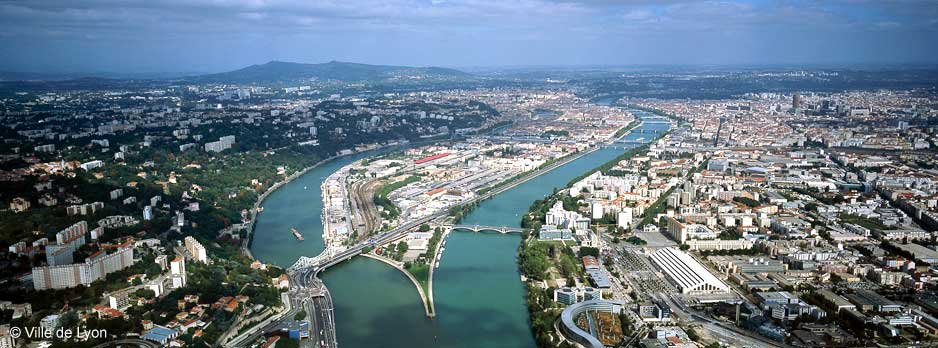

## Data
For this capstone, I will merge three sources of data :
- Neighborhoods names and limits will be downloaded from the Lyon metropole website. It includes not only Lyon but also some close cities (https://data.grandlyon.com/)
- Travel time to the city center will be computed using the HERE api (https://developer.here.com/)
- Number of Pizzerias and Asian Restaurants will be computed using Foursquare.

## Methodology
First, let's set the location of Lyon city center and of my work.

In [1]:
work_latlon=[45.741663, 4.894655]
lyon_latlon=[45.764043,4.835659]


Then, I want to define a progressbar, just to make the long operations fancier

In [2]:
import sys

def progress(count, total, status=''):
    bar_len = 60
    filled_len = int(round(bar_len * count / float(total)))

    percents = round(100.0 * (count+1) / float(total), 1)
    bar = '=' * filled_len + '-' * (bar_len - filled_len)

    sys.stdout.write('[%s] %s%s ...%s\r' % (bar, percents, '%', status+'                        '))
    sys.stdout.flush() # As suggested by Rom Ruben (see: http://stackoverflow.com/questions/3173320/text-progress-bar-in-the-console/27871113#comment50529068_27871113)


### List of Neighborhoods
Here is where I found the list of Neighborhoods ("Quartiers" in French) for my city and all the cities in the "urban community" of Lyon. Some close cities are not here, some are quite far away, but it will make the job...

In [3]:
quartiers_list_url='https://download.data.grandlyon.com/wfs/grandlyon?SERVICE=WFS&VERSION=2.0.0&outputformat=GEOJSON&maxfeatures=300&request=GetFeature&typename=adr_voie_lieu.adrquartier&SRSNAME=urn:ogc:def:crs:EPSG::4326'
import urllib.request, json 
with urllib.request.urlopen(quartiers_list_url) as url:
    geo_data_Lyon = json.loads(url.read().decode())

Now, I start making the pandas dataframe

In [4]:
import pandas as pd
        
df_Lyon=pd.DataFrame(columns=['Quartier','Latitude','Longitude','Code'])
df_Lyon=df_Lyon.set_index('Quartier')

The list does not include the center of each neighborhood. I will compute it using the "shapely" package. The geopy_distance will be used to compute the distance from the city center

In [5]:
from shapely import geometry
import geopy.distance

for i in geo_data_Lyon['features']:
    quartier=i['properties']['nom']
    # The following line computes the centroid of each quartier from the coordinates of its boundary
    centroid_quartier= geometry.Polygon(i['geometry']['coordinates'][0]).centroid
    df_Lyon.loc[quartier,'Longitude']=centroid_quartier.xy[0][0]
    df_Lyon.loc[quartier,'Latitude']=centroid_quartier.xy[1][0]
    df_Lyon.loc[quartier,'Code']=i['properties']['identifiant']
    df_Lyon.loc[quartier,'Distance to city center']=geopy.distance.vincenty(lyon_latlon, [df_Lyon.loc[quartier,'Latitude'],df_Lyon.loc[quartier,'Longitude']]).km
     

And here is my dataframe

In [6]:
df_Lyon.head()


,Latitude,Longitude,Code,Distance to city center
Quartier,,,,
Quartier Razes,45.6668,4.84906,S5262,10.856216
Quartier Clochettes,45.6927,4.85622,S5362,8.085904
Quartier Pasteur,45.6678,4.96522,S5417,14.699125
Quartier Ménival La Cordière,45.6953,4.95194,S5365,11.841514
Quartier Revaison,45.7041,4.92516,S5368,9.640092


It has 197 neighborhoods... And now is the map of the neighborhoods. Red marker is where I work and green one is where I work

In [7]:
print(df_Lyon.shape)

(197, 4)


In [8]:
import folium

map_lyon = folium.Map(location=lyon_latlon,zoom_start=11)
folium.GeoJson(geo_data_Lyon,name='geojson').add_to(map_lyon)
folium.Marker(work_latlon, popup="Eastern Hospital of Lyon",icon=folium.Icon(color='red')).add_to(map_lyon)
folium.Marker(lyon_latlon, popup="Lyon City center",icon=folium.Icon(color='green')).add_to(map_lyon)

display(map_lyon)

## Time to work

I'm also interested in the time needed to reach the city center. Let's see how long it takes me for a normal morning such as Monday 2 september 2019 at 8am.

Note: time is provided in seconds in HERE, so I divide it by 60 to get minutes

In [9]:
import requests
HERE_ID='BvFZyFsaYuexvWlkZYJL'
HERE_Code='zpYUZUbA80GSYCEVCVr3EQ'
departure_time='2019-09-02T08:00:00'

df_Lyon['Time to work'] = 0
iterr=0
for index,row in df_Lyon.iterrows(): 

    url = 'https://route.api.here.com/routing/7.2/calculateroute.json?app_id={}&app_code={}&waypoint0=geo!{},{}&waypoint1=geo!{},{}&departure={}&mode=fastest;publicTransport&combineChange=true'.format(
                    HERE_ID, 
                    HERE_Code, 
                    str(work_latlon[0]), 
                    str(work_latlon[1]), 
                    df_Lyon.loc[index,'Latitude'],
                    df_Lyon.loc[index,'Longitude'],
                    departure_time)
    
    results = requests.get(url).json()
    travel_time=results['response']['route'][0]['summary']['travelTime']/60
    df_Lyon.loc[index,'Time to work']=travel_time
    progress(iterr,len(df_Lyon.index),index + ' : travel time = ' + str(travel_time) + ' min')
    iterr=iterr+1
    
    


In [10]:
df_Lyon.head()

,Latitude,Longitude,Code,Distance to city center,Time to work
Quartier,,,,,
Quartier Razes,45.6668,4.84906,S5262,10.856216,68.316667
Quartier Clochettes,45.6927,4.85622,S5362,8.085904,56.683333
Quartier Pasteur,45.6678,4.96522,S5417,14.699125,68.233333
Quartier Ménival La Cordière,45.6953,4.95194,S5365,11.841514,49.616667
Quartier Revaison,45.7041,4.92516,S5368,9.640092,56.166667


### The pizzeria index

The pizzeria index (but it can also be applied to any type of restaurant) is defined as the weighted number of pizzerias in a given radius around a position defined by (lat,lon).
- Every restaurant at a distance smaller than optimalradius counts as 1
- Every restaurant at a distance between optimalradius and maxradius has a value between 0 and 1, which varies linearly with the distance, according to the formula : (maxradius-distance)/(maxradius-optimalradius)

For instance, if there are 3 pizzerias at a distance of 100, 200 and 500m from a given location, with optimalradius=100 and maxradius=1100, their individual value will be 1; (1100-200)/(1100-100)=0.9; (1100-500)/(1100-100)=0.6; and the pizzeria index will be 2.5.

This function has also as input the category ID of the restaurant as defined by the API (https://developer.foursquare.com/docs/resources/categories). For the pizzerias, we also take into account Italian restaurants. 


The following function uses foursquare to find all the venues of a type in Foursquare, and take into account only the distances to the point defined by (lat,lon), and return the sum of the scores for each venue

In [11]:
import numpy as np
def pizzeriaindex(lat,lon,categoryId,optimalradius,maxradius):
    CLIENT_ID = 'UIRSCSXIXPDESJTRUONY3YOBZXWBXY2DCSZIFV142FLHSW22' # your Foursquare ID
    CLIENT_SECRET = '3EVG0B55FAOGUBK2FSLVM3A42HDJNDXYNEB1MXTRF0ECFC4R' # your Foursquare Secret
    VERSION = '20181001'
    LIMIT = 100 # limit of number of venues returned by Foursquare API
        # create the API request URL
    url = 'https://api.foursquare.com/v2/venues/search?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}'.format(
                    CLIENT_ID, 
                    CLIENT_SECRET, 
                    VERSION, 
                    lat, 
                    lon, 
                    maxradius, 
                    LIMIT,
                    categoryId)
    results = requests.get(url).json()
    listofdistances=np.array([v['location']['distance'] for v in results['response']['venues']])
    listofdistances[listofdistances < optimalradius] = optimalradius
    listofdistances[listofdistances > maxradius] = maxradius
    return np.sum((maxradius-listofdistances)/(maxradius-optimalradius))

Now, I run the function for all the neighborhoods, and both for pizzerias(id='4bf58dd8d48988d1ca941735,4bf58dd8d48988d110941735') and asian restaurants (id='4bf58dd8d48988d142941735')

Note that the search radius varies for the two types of restaurants.

In [12]:
iterr=0
df_Lyon['Pizzeria Index']=0
df_Lyon['Asian Restaurant Index']=0

for index,row in df_Lyon.iterrows(): 
    df_Lyon.loc[index,'Pizzeria Index']=pizzeriaindex(row['Latitude'],row['Longitude'],'4bf58dd8d48988d1ca941735,4bf58dd8d48988d110941735',100,1100)
    df_Lyon.loc[index,'Asian Restaurant Index']=pizzeriaindex(row['Latitude'],row['Longitude'],'4bf58dd8d48988d142941735',200,2200)
    progress(iterr,len(df_Lyon.index),index + ' : PI = ' + str(df_Lyon.loc[index,'Pizzeria Index']) + ' ; ARI = ' + str(df_Lyon.loc[index,'Asian Restaurant Index']) )
    iterr=iterr+1

    
    
    

In [13]:
df_Lyon.head()

,Latitude,Longitude,Code,Distance to city center,Time to work,Pizzeria Index,Asian Restaurant Index
Quartier,,,,,,,
Quartier Razes,45.6668,4.84906,S5262,10.856216,68.316667,0.000,0.0000
Quartier Clochettes,45.6927,4.85622,S5362,8.085904,56.683333,0.000,0.0000
Quartier Pasteur,45.6678,4.96522,S5417,14.699125,68.233333,0.714,0.0000
Quartier Ménival La Cordière,45.6953,4.95194,S5365,11.841514,49.616667,1.124,0.7215
Quartier Revaison,45.7041,4.92516,S5368,9.640092,56.166667,0.409,0.5100


## Results

Now let's see the maps. First, the Time by public transportation to work.

In [14]:
import folium

map_lyon = folium.Map(location=lyon_latlon,zoom_start=12)

#Note :  you have to put the quartier as a proper column before doing this
map_lyon.choropleth(
    geo_data=geo_data_Lyon,
    data=df_Lyon.reset_index(level=0),
    columns=["Quartier",'Time to work'],
    key_on='feature.properties.nom',
    fill_color='BuPu', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Time by public transportation to work'
)
folium.Marker(work_latlon, popup="Eastern Hospital of Lyon",icon=folium.Icon(color='red')).add_to(map_lyon)
folium.Marker(lyon_latlon, popup="Lyon City center",icon=folium.Icon(color='green')).add_to(map_lyon)
display(map_lyon)

Then the pizzeria index and the asian restaurant index

In [15]:
map_pizzerias = folium.Map(location=work_latlon,zoom_start=12)

#Note :  you have to put the quartier as a proper column before doing this
map_pizzerias.choropleth(
    geo_data=geo_data_Lyon,
    data=df_Lyon.reset_index(level=0),
    columns=["Quartier",'Pizzeria Index'],
    key_on='feature.properties.nom',
    fill_color='BuPu', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Pizzeria Index'
)
folium.Marker(work_latlon, popup="Eastern Hospital of Lyon",icon=folium.Icon(color='red')).add_to(map_lyon)
folium.Marker(lyon_latlon, popup="Lyon City center",icon=folium.Icon(color='green')).add_to(map_lyon)

display(map_pizzerias)

In [16]:
map_asian = folium.Map(location=work_latlon,zoom_start=12)

#Note :  you have to put the quartier as a proper column before doing this
map_asian.choropleth(
    geo_data=geo_data_Lyon,
    data=df_Lyon.reset_index(level=0),
    columns=["Quartier",'Asian Restaurant Index'],
    key_on='feature.properties.nom',
    fill_color='BuPu', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Asian Restaurant Index'
)
folium.Marker(work_latlon, popup="Eastern Hospital of Lyon",icon=folium.Icon(color='red')).add_to(map_lyon)
folium.Marker(lyon_latlon, popup="Lyon City center",icon=folium.Icon(color='green')).add_to(map_lyon)
display(map_asian)

Finally, I can compute the maximum rent for each neighborhood and sort the Neighborhoods according to this value. I also remove all the neighborhoods where the final rent is below 0€ (you'll have to pay me if you want me to live there ! ;-) )

In [17]:
df_Lyon2=df_Lyon
df_Lyon2['Maximum Rent']=1000+10*df_Lyon2['Asian Restaurant Index']+10*df_Lyon2['Pizzeria Index']-20*df_Lyon2['Time to work']
df_Lyon2=df_Lyon.sort_values('Maximum Rent',ascending=False)
df_Lyon2[df_Lyon2['Maximum Rent'] < 0] = 0


And here is the map !

In [18]:

map_final = folium.Map(location=work_latlon,zoom_start=12)

#Note :  you have to put the quartier as a proper column before doing this
map_final.choropleth(
    geo_data=geo_data_Lyon,
    data=df_Lyon2.reset_index(level=0),
    columns=["Quartier",'Maximum Rent'],
    key_on='feature.properties.nom',
    fill_color='BuPu', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Max rent'
)
folium.Marker(work_latlon, popup="Eastern Hospital of Lyon",icon=folium.Icon(color='red')).add_to(map_final)
folium.Marker(lyon_latlon, popup="Lyon City center",icon=folium.Icon(color='green')).add_to(map_final)
display(map_final)


And here is the top 10 of the Neighborhoods where I could live :

In [19]:
df_Lyon2.head(10)


,Latitude,Longitude,Code,Distance to city center,Time to work,Pizzeria Index,Asian Restaurant Index,Maximum Rent
Quartier,,,,,,,,
Quartier Vinatier,45.7428,4.89998,S7877,5.534371,8.500000,0.145,0.7000,838.450000
Quartier Bellecour Cordeliers,45.7616,4.83513,S5307,0.272293,31.266667,18.483,25.3220,812.716667
Quartier Bas des Pentes Presqu'île,45.7684,4.83574,S5243,0.489078,30.083333,19.375,20.7580,799.663333
Quartier Bellecour Carnot,45.7536,4.83012,S5308,1.237167,28.950000,14.972,20.7885,778.605000
Quartier Mutualité Préfecture Moncey,45.759,4.84389,S5240,0.851747,30.733333,10.095,27.4935,761.218333
Quartier Montchat,45.7479,4.88634,S5239,4.331107,16.500000,3.589,5.2705,758.595000
Quartier Jean Macé,45.7453,4.8439,S5320,2.174541,28.066667,17.899,12.4180,741.836667
Quartier Genêts,45.7503,4.90281,S5434,5.443805,15.116667,1.271,1.6530,726.906667
Quartier Guillotière,45.7499,4.84856,S5319,1.867438,30.650000,15.840,16.5625,711.025000


# Discussion

Clearly, here, there are two options: either be close to my work and have very few pizzerias and asian shops (e.g. Quartier Vinatier). Or live in the city center (e.g. Bellecour Cordeliers) which is further from my work but has a lot of nice places. A good compromise could be the Quartier Montchat, which has an average number of Pizzerias and asian restaurants while remaining quite close from my work. 

At this point, I want to focus that the choice will be mostly a matter of compromise:

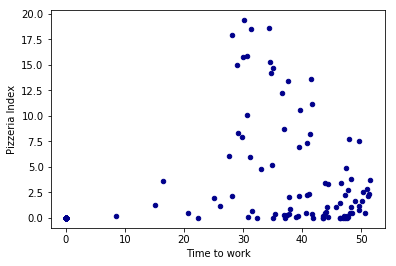

In [23]:
%matplotlib inline
ax1 = df_Lyon2.plot.scatter(x='Time to work',
       y='Pizzeria Index',
       c='DarkBlue')

On this graph, the ideal conditions are at the top left (high pizzeria index and low time to work), so any point located close to this point can be considered as optimal.

I also realize that it may not make sense to have a linear scale for the Asian Restaurant Index and the Pizzeria Index. There is a higher difference between two neighborhoods having 1 or 2 pizzerias closeby than two others having 21 or 22 pizzerias. A simple way to solve this problem would be to use the square root of the pizzeria and asian restaurant index.  

In [24]:
df_Lyon3=df_Lyon
df_Lyon3['Maximum Rent']=1000+55*np.sqrt(df_Lyon3['Asian Restaurant Index'])+55*np.sqrt(df_Lyon3['Pizzeria Index'])-20*df_Lyon3['Time to work']
df_Lyon3=df_Lyon.sort_values('Maximum Rent',ascending=False)
df_Lyon3[df_Lyon3['Maximum Rent'] < 0] = 0

map_final2 = folium.Map(location=work_latlon,zoom_start=12)

#Note :  you have to put the quartier as a proper column before doing this
map_final2.choropleth(
    geo_data=geo_data_Lyon,
    data=df_Lyon3.reset_index(level=0),
    columns=["Quartier",'Maximum Rent'],
    key_on='feature.properties.nom',
    fill_color='BuPu', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Max rent'
)
folium.Marker(work_latlon, popup="Eastern Hospital of Lyon",icon=folium.Icon(color='red')).add_to(map_final2)
folium.Marker(lyon_latlon, popup="Lyon City center",icon=folium.Icon(color='green')).add_to(map_final2)
display(map_final2)


In [25]:
df_Lyon3.head(10)


,Latitude,Longitude,Code,Distance to city center,Time to work,Pizzeria Index,Asian Restaurant Index,Maximum Rent
Quartier,,,,,,,,
Quartier Montchat,45.7479,4.88634,S5239,4.331107,16.500000,3.589,5.2705,900.462242
Quartier Vinatier,45.7428,4.89998,S7877,5.534371,8.500000,0.145,0.7000,896.959678
Quartier Bas des Pentes Presqu'île,45.7684,4.83574,S5243,0.489078,30.083333,19.375,20.7580,891.012280
Quartier Bellecour Cordeliers,45.7616,4.83513,S5307,0.272293,31.266667,18.483,25.3220,887.887229
Quartier Bellecour Carnot,45.7536,4.83012,S5308,1.237167,28.950000,14.972,20.7885,884.584420
Quartier Jean Macé,45.7453,4.8439,S5320,2.174541,28.066667,17.899,12.4180,865.171826
Quartier Mutualité Préfecture Moncey,45.759,4.84389,S5240,0.851747,30.733333,10.095,27.4935,848.471142
Quartier Genêts,45.7503,4.90281,S5434,5.443805,15.116667,1.271,1.6530,830.385893
Quartier Guillotière,45.7499,4.84856,S5319,1.867438,30.650000,15.840,16.5625,829.731019


In that case (and using 55 euros instead of 10 for the pizzeria/asian restaurant bonuses), the Quartier Montchat (the best-balanced one) is ranked first !

# Conclusion
The most difficult is not to find and process the data, but to decide the weight of each factor ! Also, I should consider other factors, such as the vicinity of parks, and so on...

But with this data, I would definitively choose Montchat !